In [1]:
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import utils
import trainer
import evaluator
import data_process
import motion_blur
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
data_process.download_data()

input_size = 320

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size)

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



In [ ]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_best_params.json", train_set=train_set, val_set=val_set, save_path="data/models/ssdlite320_mobilenet_v3_large/", kornia_aug=False)

Starting training for ssdlite320_mobilenet_v3_large with the following parameters:
{'batch_size': 7, 'epochs': 17, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.000721282926313481, 'beta1': 0.9073359186756311, 'beta2': 0.9910589483762591, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 1.4508027487967911e-06}
Epoch 1/17, Train Loss: 256.0567, Val mAP@50: 0.4210, FPS: 420.62, Epoch Time: 5.59 seconds
Epoch 2/17, Train Loss: 165.5241, Val mAP@50: 0.4033, FPS: 547.19, Epoch Time: 5.14 seconds
Epoch 3/17, Train Loss: 125.1685, Val mAP@50: 0.4092, FPS: 545.66, Epoch Time: 5.13 seconds
Epoch 4/17, Train Loss: 102.0194, Val mAP@50: 0.4244, FPS: 545.59, Epoch Time: 5.16 seconds
Epoch 5/17, Train Loss: 77.0728, Val mAP@50: 0.4347, FPS: 543.22, Epoch Time: 5.16 seconds
Epoch 6/17, Train Loss: 67.4466, Val mAP@50: 0.4370, FPS: 544.05, Epoch Time: 5.17 seconds
Epoch 7/17, Train Loss: 62.3500, Val mAP@50: 0.4551, FPS: 543.57, Epoch Time: 5.17 seconds
Epoch 8/17, Train Loss:

Mean Average Precision @ 0.5 : 0.4310 FPS: 452.40


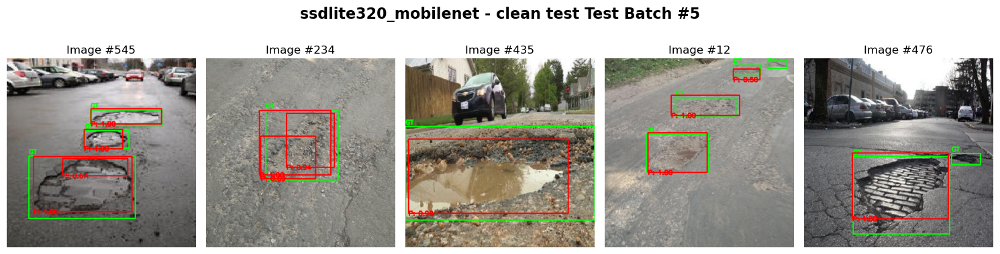

Mean Average Precision @ 0.5 : 0.3657 FPS: 458.51


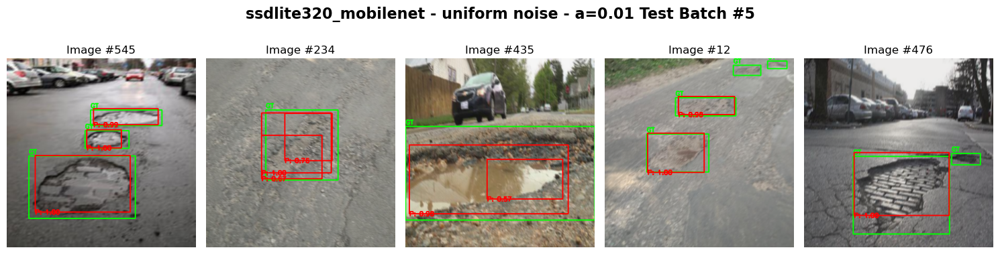

Mean Average Precision @ 0.5 : 0.1207 FPS: 452.98


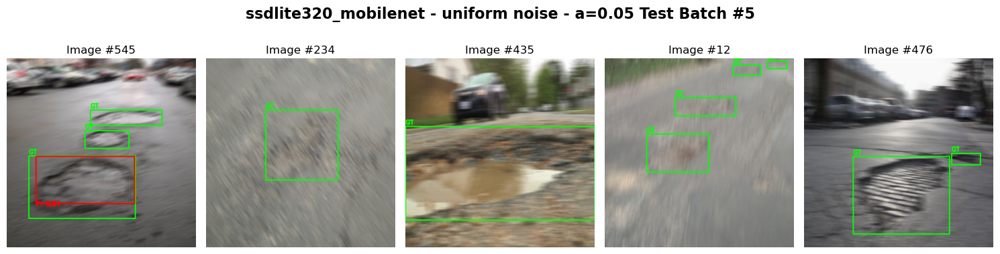

Mean Average Precision @ 0.5 : 0.0549 FPS: 454.69


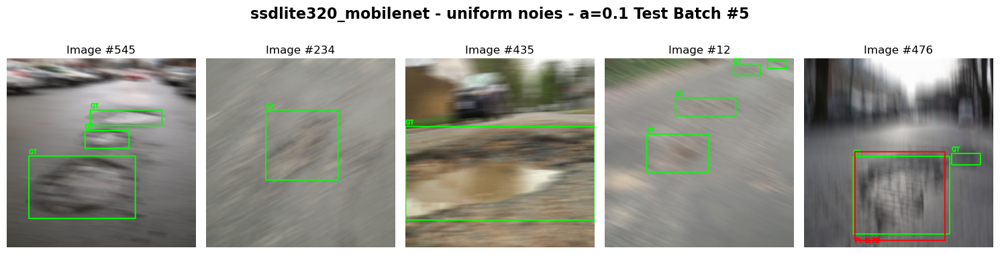

Mean Average Precision @ 0.5 : 0.3570 FPS: 445.32


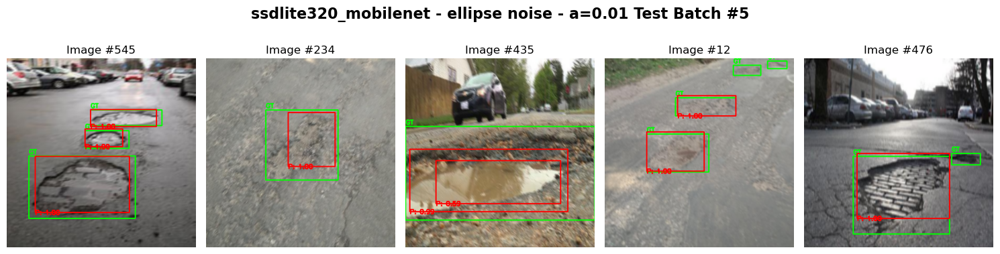

Mean Average Precision @ 0.5 : 0.1612 FPS: 446.78


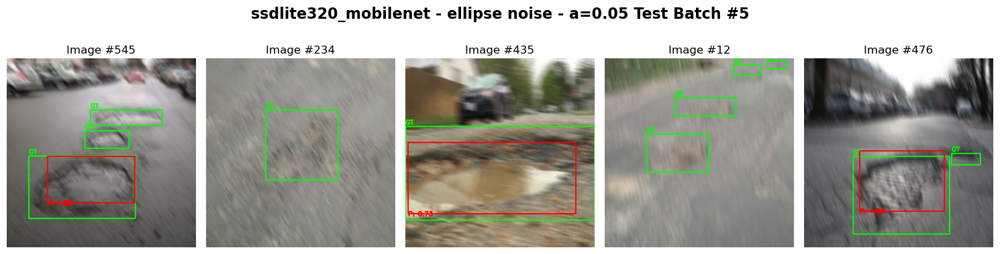

Mean Average Precision @ 0.5 : 0.0538 FPS: 451.85


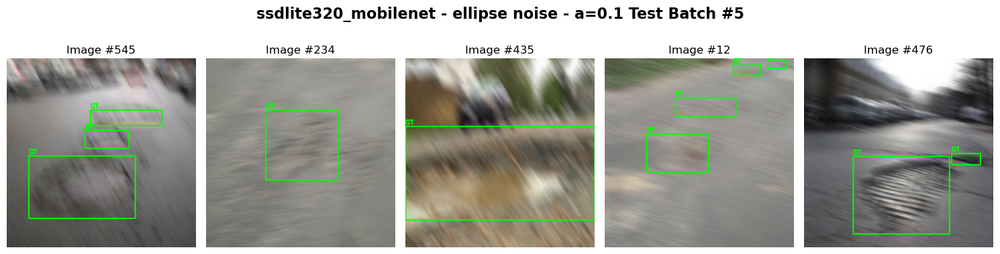

Mean Average Precision @ 0.5 : 0.2911 FPS: 452.34


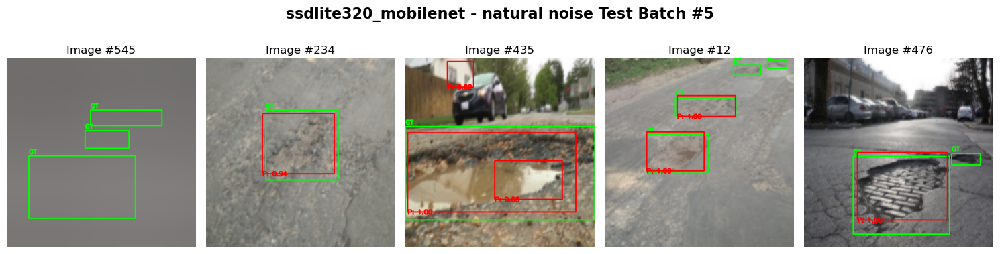

In [9]:
model_name = "ssdlite320_mobilenet_v3_large"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssdlite320_mobilenet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssdlite320_mobilenet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssdlite320_mobilenet - natural noise")


In [5]:
# save history to .json file
utils.update_json(history, model_name="ssdlite320_mobilenet")

In [6]:
# Train with data augmentation
history = trainer.train_from_config(model_config_path="data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_best_params.json", train_set=train_set, val_set=val_set, save_path="data/models/ssdlite320_mobilenet_v3_large/", kornia_aug=True)

Starting training for ssdlite320_mobilenet_v3_large with the following parameters:
{'batch_size': 7, 'epochs': 20, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.000721282926313481, 'beta1': 0.9073359186756311, 'beta2': 0.9910589483762591, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 1.4508027487967911e-06}
Epoch 1/20, Train Loss: 267.1789, Val mAP@50: 0.4078, FPS: 548.22, Epoch Time: 5.41 seconds
Epoch 2/20, Train Loss: 196.8735, Val mAP@50: 0.3620, FPS: 544.86, Epoch Time: 5.38 seconds
Epoch 3/20, Train Loss: 170.4296, Val mAP@50: 0.4014, FPS: 542.94, Epoch Time: 5.36 seconds
Epoch 4/20, Train Loss: 142.4259, Val mAP@50: 0.4243, FPS: 535.13, Epoch Time: 5.46 seconds
Epoch 5/20, Train Loss: 124.3057, Val mAP@50: 0.4275, FPS: 536.80, Epoch Time: 5.46 seconds
Epoch 6/20, Train Loss: 119.6778, Val mAP@50: 0.4130, FPS: 536.40, Epoch Time: 5.47 seconds
Epoch 7/20, Train Loss: 108.7377, Val mAP@50: 0.4128, FPS: 531.32, Epoch Time: 5.45 seconds
Epoch 8/20, Train Lo

Mean Average Precision @ 0.5 : 0.3920 FPS: 447.31


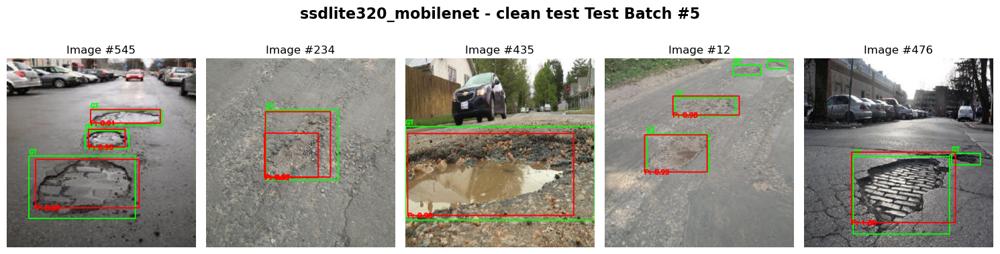

Mean Average Precision @ 0.5 : 0.3817 FPS: 450.58


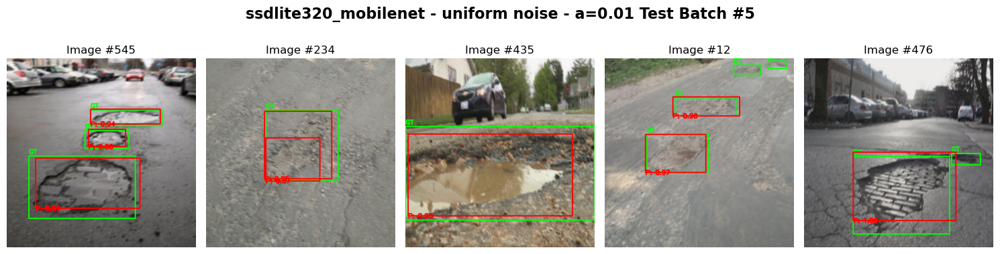

Mean Average Precision @ 0.5 : 0.3647 FPS: 444.87


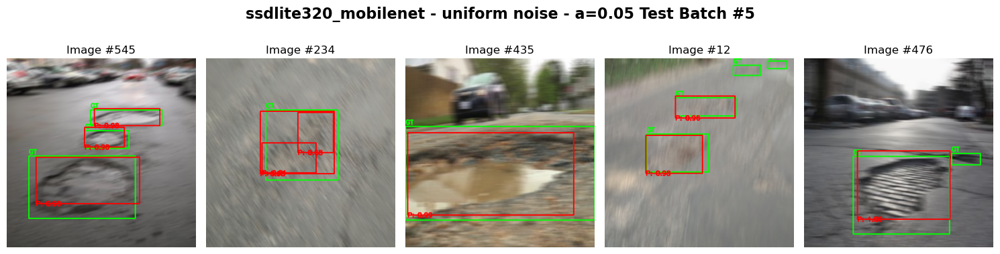

Mean Average Precision @ 0.5 : 0.3340 FPS: 450.18


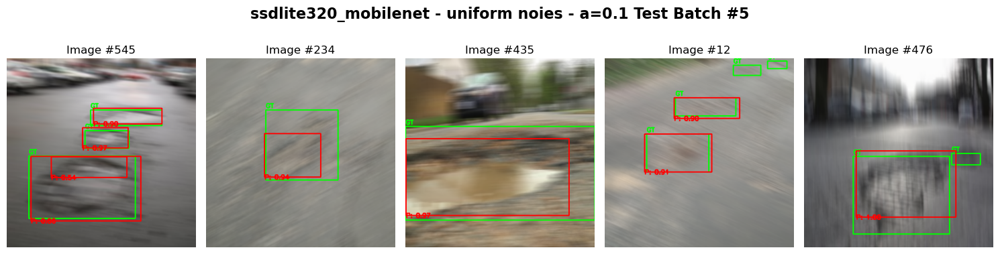

Mean Average Precision @ 0.5 : 0.3811 FPS: 453.67


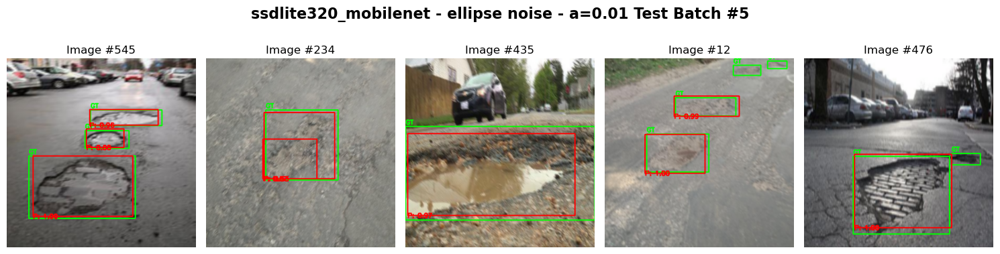

Mean Average Precision @ 0.5 : 0.3647 FPS: 455.84


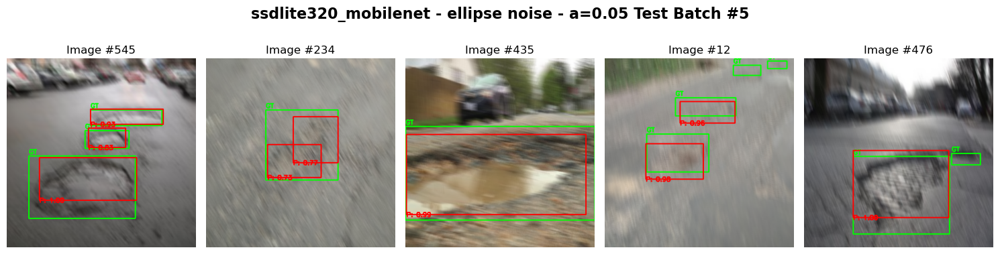

Mean Average Precision @ 0.5 : 0.2428 FPS: 452.44


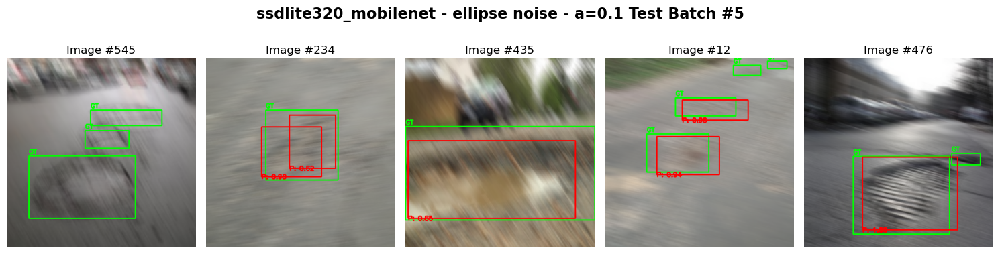

Mean Average Precision @ 0.5 : 0.3184 FPS: 455.83


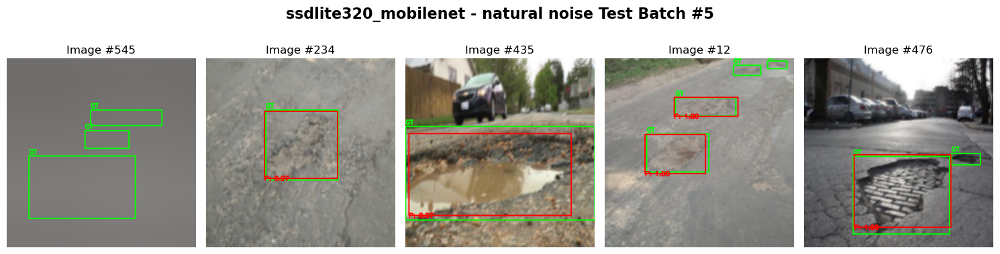

In [10]:
model_name = "ssdlite320_mobilenet_v3_large"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssdlite320_mobilenet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssdlite320_mobilenet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssdlite320_mobilenet - natural noise")

In [8]:
# save history to .json file
utils.update_json(history, model_name="ssdlite320_mobilenet_aug")